# NB7 — Explainability: Grad-CAM, Cross-Attention Maps, t-SNE, Calibration

**GastroNet project — C.2 item 3 (revised scope).** Since NB6 showed the 4 architectures are statistically tied on accuracy, and NB6b showed they mostly fail on the *same* images, this notebook asks: **how do they differ despite that tie?** What evidence do they use, where do they cleanly separate classes in embedding space even at equal accuracy, and whose confidence can actually be trusted?

### What's reused vs. new
All model classes below (`build_cnn_model`, `build_vit_model`, `HybridConcatModel`, `CNNSpatialEncoder`/`ViTTokenEncoder`/`CrossAttentionBlock`/`HybridCrossAttnModel`) are copied **verbatim** from your actual NB1/NB2/NB3/NB5 — not reconstructed from the handoff doc's prose — so `load_state_dict` against your real `best.pt` checkpoints will work without surgery.

### Methodology decisions
- **Grad-CAM & cross-attention maps use one representative checkpoint per model family** — the seed with the highest `best_val_acc` (same tiebreak rule NB6/NB6b used for the ensemble). These are about *a specific trained instance's* behavior, not a statistical claim, so ensembling 3 seeds doesn't make sense here the way it did for McNemar's — a single well-chosen representative is the standard choice for this kind of qualitative figure.
- **Calibration (ECE) uses all 3 seeds, mean±std** — same multi-seed rigor as everything else in this project (A.5/A.12), since it's a quantitative, comparable metric, not a picture.
- **Grad-CAM is scoped to CNN branches only** (`cnn_only_v2`, and the CNN branch inside `hybrid_concat_v2`/`hybrid_crossattn_v2`) — `vit_only_v2` isn't included, matching C.2 item 3's own scope (Grad-CAM for CNN, cross-attention maps for the fusion model; `vit_only_v2` still participates in the t-SNE and calibration sections).
- **Target images**: rather than picking images arbitrarily, this notebook recomputes NB6b's error registry directly from `results.json` (self-contained — doesn't require NB6b's CSV to exist) and prioritizes: (1) the images every architecture gets wrong, (2) examples of the dominant confusion pair, (3) a couple of unanimous-correct images as a sanity-check control.

## 1. Setup

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install timm --break-system-packages -q

import os, sys, json, glob, re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter, defaultdict
from PIL import Image

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import timm
from torchvision import transforms
import torchvision.transforms.functional as TF

ACCOUNT_TAG      = "acct_A"   # only used if you re-log manifest events; adjust if this account differs
EXPERIMENTS_ROOT = "/content/drive/MyDrive/gastronet_experiments"
RAW_DATASET_DIR  = "/content/drive/MyDrive/gastronet_raw_dataset"
SPLIT_JSON_PATH  = os.path.join(EXPERIMENTS_ROOT, "dataset_split_v2.json")

MODEL_FAMILIES = ["cnn_only_v2", "vit_only_v2", "hybrid_concat_v2", "hybrid_crossattn_v2"]
SEEDS = [42, 123, 7]
CLASS_NAMES = ["Diverticulosis", "Neoplasm", "Peritonitis", "Ureters"]
CLASS_TO_IDX = {c: i for i, c in enumerate(CLASS_NAMES)}
IMG_SIZE_CNN = 448
IMG_SIZE_VIT = 224
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

sys.path.insert(0, EXPERIMENTS_ROOT)
import checkpoint_utils as cku
print("checkpoint_utils imported OK")

Device: cuda
checkpoint_utils imported OK


## 2. Model class definitions

**Copied verbatim from your uploaded notebooks** — not reconstructed.

### 2a. `cnn_only_v2` (verbatim from NB1)

In [3]:
from torchvision.models import efficientnet_b4, EfficientNet_B4_Weights

def build_cnn_model(num_classes=len(CLASS_NAMES)):
    weights = EfficientNet_B4_Weights.IMAGENET1K_V1
    model = efficientnet_b4(weights=weights)
    in_features = model.classifier[1].in_features
    model.classifier[1] = nn.Linear(in_features, num_classes)
    return model

### 2b. `vit_only_v2` (verbatim from NB2)

In [4]:
def build_vit_model(num_classes=len(CLASS_NAMES)):
    model = timm.create_model("vit_small_patch16_224", pretrained=True, num_classes=num_classes)
    return model

### 2c. `hybrid_concat_v2` (verbatim from NB3)

In [5]:
class HybridConcatModel(nn.Module):
    def __init__(self, num_classes=len(CLASS_NAMES)):
        super().__init__()
        cnn_weights = EfficientNet_B4_Weights.IMAGENET1K_V1
        cnn = efficientnet_b4(weights=cnn_weights)
        self.cnn_features = cnn.features
        self.cnn_pool = cnn.avgpool
        cnn_feature_dim = cnn.classifier[1].in_features

        self.vit = timm.create_model("vit_small_patch16_224", pretrained=True, num_classes=0)
        vit_feature_dim = self.vit.num_features

        fused_dim = cnn_feature_dim + vit_feature_dim
        self.classifier = nn.Sequential(
            nn.Linear(fused_dim, 256),
            nn.ReLU(inplace=True),
            nn.Dropout(0.3),
            nn.Linear(256, num_classes),
        )
        self.cnn_feature_dim = cnn_feature_dim
        self.vit_feature_dim = vit_feature_dim

    def forward(self, cnn_img, vit_img):
        cnn_feat = self.cnn_features(cnn_img)
        cnn_feat = self.cnn_pool(cnn_feat)
        cnn_feat = torch.flatten(cnn_feat, 1)
        vit_feat = self.vit(vit_img)
        fused = torch.cat([cnn_feat, vit_feat], dim=1)
        return self.classifier(fused)

    def forward_fused_features(self, cnn_img, vit_img):
        """NB7 addition (not in NB3): returns the fused feature vector *before*
        self.classifier, for t-SNE (Section 6). Identical computation to forward(),
        just stops one step earlier -- does not change trained behavior."""
        cnn_feat = self.cnn_features(cnn_img)
        cnn_feat = self.cnn_pool(cnn_feat)
        cnn_feat = torch.flatten(cnn_feat, 1)
        vit_feat = self.vit(vit_img)
        return torch.cat([cnn_feat, vit_feat], dim=1)

def build_hybrid_concat_model(num_classes=len(CLASS_NAMES)):
    return HybridConcatModel(num_classes)

### 2d. `hybrid_crossattn_v2` (verbatim from NB5)

In [6]:
class CNNSpatialEncoder(nn.Module):
    def __init__(self, pretrained=True):
        super().__init__()
        weights = torchvision.models.EfficientNet_B4_Weights.DEFAULT if pretrained else None
        backbone = torchvision.models.efficientnet_b4(weights=weights)
        self.features = backbone.features
        self.out_channels = 1792

    def forward(self, x):
        return self.features(x)


class ViTTokenEncoder(nn.Module):
    def __init__(self, pretrained=True):
        super().__init__()
        self.vit = timm.create_model("vit_small_patch16_224", pretrained=pretrained, num_classes=0)
        self.embed_dim = self.vit.embed_dim
        self.num_prefix_tokens = getattr(self.vit, "num_prefix_tokens", 1)

    def forward(self, x):
        tokens = self.vit.forward_features(x)
        return tokens[:, self.num_prefix_tokens:, :]


class Learned2DPositionalEmbedding(nn.Module):
    def __init__(self, grid_h, grid_w, dim):
        super().__init__()
        self.grid_h = grid_h
        self.grid_w = grid_w
        self.row_embed = nn.Parameter(torch.zeros(grid_h, dim))
        self.col_embed = nn.Parameter(torch.zeros(grid_w, dim))
        nn.init.trunc_normal_(self.row_embed, std=0.02)
        nn.init.trunc_normal_(self.col_embed, std=0.02)

    def forward(self):
        pos = self.row_embed[:, None, :] + self.col_embed[None, :, :]
        return pos.reshape(self.grid_h * self.grid_w, -1)


class CrossAttentionBlock(nn.Module):
    def __init__(self, d_model=256, num_heads=4, ff_mult=4, dropout=0.3):
        super().__init__()
        self.attn = nn.MultiheadAttention(
            embed_dim=d_model, num_heads=num_heads, dropout=dropout, batch_first=True
        )
        self.norm1 = nn.LayerNorm(d_model)
        self.ff = nn.Sequential(
            nn.Linear(d_model, d_model * ff_mult),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(d_model * ff_mult, d_model),
        )
        self.norm2 = nn.LayerNorm(d_model)
        self.dropout = nn.Dropout(dropout)

    def forward(self, cnn_tokens, vit_tokens):
        attn_out, attn_weights = self.attn(
            query=cnn_tokens, key=vit_tokens, value=vit_tokens, need_weights=True
        )
        x = self.norm1(cnn_tokens + self.dropout(attn_out))
        x = self.norm2(x + self.ff(x))
        return x, attn_weights


class HybridCrossAttnModel(nn.Module):
    def __init__(self, num_classes=4, d_model=256, num_heads=4, num_layers=2,
                 cnn_grid=None, dropout=0.3, pretrained_backbones=True):
        super().__init__()
        self.cnn_encoder = CNNSpatialEncoder(pretrained=pretrained_backbones)
        self.vit_encoder = ViTTokenEncoder(pretrained=pretrained_backbones)

        cnn_channels = self.cnn_encoder.out_channels
        vit_dim = self.vit_encoder.embed_dim
        grid_h, grid_w = cnn_grid

        self.cnn_proj = nn.Linear(cnn_channels, d_model)
        self.pos_embed = Learned2DPositionalEmbedding(grid_h, grid_w, d_model)
        self.vit_proj = nn.Linear(vit_dim, d_model)

        self.blocks = nn.ModuleList([
            CrossAttentionBlock(d_model=d_model, num_heads=num_heads, dropout=dropout)
            for _ in range(num_layers)
        ])

        self.classifier = nn.Sequential(
            nn.Dropout(dropout),
            nn.Linear(d_model, num_classes),
        )
        self.grid_h, self.grid_w = grid_h, grid_w

    def forward(self, cnn_input, vit_input, return_attn=False, return_pooled=False):
        cnn_feat_map = self.cnn_encoder(cnn_input)
        B, C, H, W = cnn_feat_map.shape
        cnn_tokens = cnn_feat_map.flatten(2).transpose(1, 2)
        cnn_tokens = self.cnn_proj(cnn_tokens)
        cnn_tokens = cnn_tokens + self.pos_embed()[None, :, :]

        vit_tokens = self.vit_encoder(vit_input)
        vit_tokens = self.vit_proj(vit_tokens)

        attn_maps = []
        x = cnn_tokens
        for block in self.blocks:
            x, attn_weights = block(x, vit_tokens)
            attn_maps.append(attn_weights)

        pooled = x.mean(dim=1)
        logits = self.classifier(pooled)

        # NB7 addition: return_pooled lets Section 6 (t-SNE) get the pre-classifier
        # 256-dim feature without a second forward pass. Does not change trained behavior.
        if return_attn and return_pooled:
            return logits, attn_maps, pooled
        if return_attn:
            return logits, attn_maps
        if return_pooled:
            return logits, pooled
        return logits

    def backbone_parameters(self):
        return list(self.cnn_encoder.parameters()) + list(self.vit_encoder.parameters())

    def head_parameters(self):
        backbone_ids = {id(p) for p in self.backbone_parameters()}
        return [p for p in self.parameters() if id(p) not in backbone_ids]

    def set_backbone_trainable(self, trainable):
        for p in self.backbone_parameters():
            p.requires_grad = trainable


def build_crossattn_model_from_config(cfg):
    """Builds using the EXACT hyperparameters this checkpoint was trained with
    (saved in its config.json), rather than assuming NB5's defaults -- more robust
    if the config ever changes across seeds/reruns."""
    return HybridCrossAttnModel(
        num_classes=len(CLASS_NAMES),
        d_model=cfg.get("d_model", 256),
        num_heads=cfg.get("num_heads", 4),
        num_layers=cfg.get("num_layers", 2),
        cnn_grid=tuple(cfg["cnn_grid"]) if "cnn_grid" in cfg else _probe_cnn_grid(),
        dropout=0.3,
        pretrained_backbones=True,
    )

def _probe_cnn_grid():
    """Fallback only -- used if an older config.json doesn't have cnn_grid saved.
    Exactly the probing logic from NB5."""
    probe = CNNSpatialEncoder(pretrained=False).to(device).eval()
    with torch.no_grad():
        out = probe(torch.randn(2, 3, IMG_SIZE_CNN, IMG_SIZE_CNN, device=device))
    grid = (out.shape[-2], out.shape[-1])
    del probe, out
    return grid

## 3. Datasets

`GastroDualDataset` is verbatim from NB5 (reused unchanged by NB3 as well). A single-resolution `GastroDataset` is added for `cnn_only_v2`/`vit_only_v2`, matching NB1/NB2. Both are `train=False`/eval-mode only here — this notebook never trains anything.

In [7]:
_to_tensor_norm = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD),
])

class GastroDataset(torch.utils.data.Dataset):
    """Single-resolution, eval-only (matches NB1/NB2's eval_transform)."""
    def __init__(self, entries, img_size):
        self.entries = entries
        self.transform = transforms.Compose([
            transforms.Resize((img_size, img_size)),
            transforms.ToTensor(),
            transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD),
        ])

    def __len__(self):
        return len(self.entries)

    def __getitem__(self, idx):
        path, cls = self.entries[idx]
        img = Image.open(path).convert("RGB")
        return self.transform(img), CLASS_TO_IDX[cls]


class GastroDualDataset(torch.utils.data.Dataset):
    """Verbatim from NB5. train=False here always (eval only, no augmentation)."""
    def __init__(self, entries, train=False):
        self.entries = entries
        self.train = train

    def __len__(self):
        return len(self.entries)

    def _apply(self, img, size):
        img = img.resize((size, size), Image.BILINEAR)
        tensor = TF.to_tensor(img)
        tensor = TF.normalize(tensor, IMAGENET_MEAN, IMAGENET_STD)
        return tensor

    def __getitem__(self, idx):
        path, cls = self.entries[idx]
        img = Image.open(path).convert("RGB")
        cnn_tensor = self._apply(img, IMG_SIZE_CNN)
        vit_tensor = self._apply(img, IMG_SIZE_VIT)
        return cnn_tensor, vit_tensor, CLASS_TO_IDX[cls]


# Registry describing how to call/feed each family -- used throughout the rest
# of this notebook instead of repeating if/else family checks everywhere.
MODEL_FAMILY_INFO = {
    "cnn_only_v2":         dict(builder=lambda cfg: build_cnn_model(), dual_input=False),
    "vit_only_v2":         dict(builder=lambda cfg: build_vit_model(), dual_input=False),
    "hybrid_concat_v2":    dict(builder=lambda cfg: build_hybrid_concat_model(), dual_input=True),
    "hybrid_crossattn_v2": dict(builder=lambda cfg: build_crossattn_model_from_config(cfg), dual_input=True),
}

## 4. Load the test split and every `results.json` (self-contained error registry)

Recomputes the same majority-vote ensembles and error registry as NB6b, directly from `results.json` -- doesn't require NB6b's CSV to already exist. This is what picks which images Sections 5-6 actually visualize.

In [8]:
with open(SPLIT_JSON_PATH) as f:
    split_payload = json.load(f)
assert split_payload["class_names"] == CLASS_NAMES, "Class name mismatch with locked split!"
test_entries = split_payload["split"]["test"]  # list of [path, class_name], in order
SPLIT_HASH = split_payload["split_hash"]
print(f"Loaded split_hash={SPLIT_HASH}, {len(test_entries)} test images")

Loaded split_hash=d6e80caa29bff18856ae93ea635b4650, 400 test images


In [9]:
def normalize(name):
    return name.lower().replace("_", "").replace("-", "")

def find_result_file(results_root, family, seed):
    nested = os.path.join(results_root, family, f"seed_{seed}", "results.json")
    if os.path.exists(nested):
        return nested
    flat = os.path.join(results_root, f"{family}_seed{seed}_results.json")
    if os.path.exists(flat):
        return flat
    target = normalize(family)
    for fp in glob.glob(os.path.join(results_root, "**", "*.json"), recursive=True):
        base = os.path.basename(fp)
        seed_matches = [int(x) for x in re.findall(r"seed_?(\d+)", base)]
        if seed in seed_matches and normalize(base).startswith(target[:12]):
            return fp
    return None

results_data = defaultdict(dict)
for fam in MODEL_FAMILIES:
    for seed in SEEDS:
        fp = find_result_file(EXPERIMENTS_ROOT, fam, seed)
        assert fp, f"Could not find results.json for {fam} seed {seed}"
        with open(fp) as f:
            results_data[fam][seed] = json.load(f)

all_r = [results_data[fam][s] for fam in MODEL_FAMILIES for s in SEEDS]
assert len(set(r["split_hash"] for r in all_r)) == 1, "split_hash mismatch across results.json files"
assert len(set(tuple(r["labels"]) for r in all_r)) == 1, "label sequences differ across results.json files"
LABELS = np.array(all_r[0]["labels"])
assert len(LABELS) == len(test_entries), "results.json length doesn't match dataset_split_v2.json test-set length"

split_labels_as_idx = np.array([CLASS_TO_IDX[cls] for _, cls in test_entries])
assert np.array_equal(split_labels_as_idx, LABELS), "Index alignment check FAILED -- see NB6b Section 6 for what this means."
print("[OK] results.json and dataset_split_v2.json are aligned and consistent.")

[OK] results.json and dataset_split_v2.json are aligned and consistent.


In [11]:
def majority_vote_ensemble(fam):
    seed_order_by_val = sorted(SEEDS, key=lambda s: -results_data[fam][s]["best_val_acc"])
    tiebreak_seed = seed_order_by_val[0]
    preds_by_seed = {s: np.array(results_data[fam][s]["predictions"]) for s in SEEDS}
    n = len(LABELS)
    ensemble = np.zeros(n, dtype=int)
    for i in range(n):
        votes = [preds_by_seed[s][i] for s in SEEDS]
        counts = Counter(votes)
        top = max(counts.values())
        winners = [c for c, cnt in counts.items() if cnt == top]
        ensemble[i] = winners[0] if len(winners) == 1 else preds_by_seed[tiebreak_seed][i]
    return ensemble

def representative_seed(fam):
    """Seed with the highest best_val_acc for this family -- used for Grad-CAM,
    cross-attention maps, and t-SNE (Sections 5-6). See intro markdown for why."""
    return max(SEEDS, key=lambda s: results_data[fam][s]["best_val_acc"])

ensembles = {fam: majority_vote_ensemble(fam) for fam in MODEL_FAMILIES}
REP_SEED = {fam: representative_seed(fam) for fam in MODEL_FAMILIES}
print("Representative seed per family (highest best_val_acc):", REP_SEED)

n = len(LABELS)
error_matrix = np.stack([(ensembles[fam] != LABELS).astype(int) for fam in MODEL_FAMILIES], axis=1)
n_models_wrong = error_matrix.sum(axis=1)

pair_counter = Counter()
for fam in MODEL_FAMILIES:
    wrong_idx = np.where(ensembles[fam] != LABELS)[0]
    for i in wrong_idx:
        pair_counter[(CLASS_NAMES[LABELS[i]], CLASS_NAMES[ensembles[fam][i]])] += 1
dominant_pair = pair_counter.most_common(1)[0][0] if pair_counter else None
print("Dominant confusion pair (true -> predicted):", dominant_pair)

Representative seed per family (highest best_val_acc): {'cnn_only_v2': 42, 'vit_only_v2': 42, 'hybrid_concat_v2': 123, 'hybrid_crossattn_v2': 42}
Dominant confusion pair (true -> predicted): ('Ureters', 'Peritonitis')


### 4a. Select priority target images

In [12]:
N_UNANIMOUS_WRONG = 3   # every architecture wrong -- top priority
N_DOMINANT_PAIR = 3     # examples of the single most common confusion pair
N_CONTROL_CORRECT = 2   # sanity-check baseline: everyone agrees AND correct

unanimous_wrong_idx = list(np.where(n_models_wrong == len(MODEL_FAMILIES))[0][:N_UNANIMOUS_WRONG])

dominant_pair_idx = []
if dominant_pair is not None:
    true_c, pred_c = dominant_pair
    for fam in MODEL_FAMILIES:
        wrong_idx = np.where(ensembles[fam] != LABELS)[0]
        for i in wrong_idx:
            if CLASS_NAMES[LABELS[i]] == true_c and CLASS_NAMES[ensembles[fam][i]] == pred_c and i not in dominant_pair_idx:
                dominant_pair_idx.append(int(i))
    dominant_pair_idx = dominant_pair_idx[:N_DOMINANT_PAIR]

correct_everywhere = np.where(n_models_wrong == 0)[0]
rng = np.random.RandomState(42)
control_idx = list(rng.choice(correct_everywhere, size=min(N_CONTROL_CORRECT, len(correct_everywhere)), replace=False))

PRIORITY_INDICES = [("unanimous_error", i) for i in unanimous_wrong_idx] + \
                    [("dominant_confusion_pair", i) for i in dominant_pair_idx] + \
                    [("control_correct", i) for i in control_idx]

print(f"{len(PRIORITY_INDICES)} priority target images selected:")
for tag, i in PRIORITY_INDICES:
    print(f"  [{tag:24s}] idx={i} true={CLASS_NAMES[LABELS[i]]} "
          f"path={test_entries[i][0]}")

8 priority target images selected:
  [unanimous_error         ] idx=136 true=Neoplasm path=/content/drive/MyDrive/gastronet_raw_dataset/Neoplasm/080f65da-aa22-4663-8923-3f4da73c6dca.jpg
  [unanimous_error         ] idx=315 true=Ureters path=/content/drive/MyDrive/gastronet_raw_dataset/Ureters/45f2bb33-9a0c-4ab1-bfd2-01326ed4578d.jpg
  [unanimous_error         ] idx=374 true=Ureters path=/content/drive/MyDrive/gastronet_raw_dataset/Ureters/85765b18-d745-4d36-aade-93b00bbe90ce.jpg
  [dominant_confusion_pair ] idx=374 true=Ureters path=/content/drive/MyDrive/gastronet_raw_dataset/Ureters/85765b18-d745-4d36-aade-93b00bbe90ce.jpg
  [dominant_confusion_pair ] idx=396 true=Ureters path=/content/drive/MyDrive/gastronet_raw_dataset/Ureters/e082e610-33e6-4aef-9dd9-3c023ef499bd.jpg
  [dominant_confusion_pair ] idx=331 true=Ureters path=/content/drive/MyDrive/gastronet_raw_dataset/Ureters/bcf701be-4f72-423c-a3e1-fb440a4e95bf.jpg
  [control_correct         ] idx=276 true=Peritonitis path=/content/d

## 5. Checkpoint loading helper

Uses `checkpoint_utils.load_best` and `assert_split_hash_matches` exactly as every training notebook does -- consistent with A.12's standing rule (never trust a checkpoint without checking its split_hash first).

**GPU memory strategy** (added after hitting an OOM here): `load_checkpoint` caches models so Section 6 can reuse the same 3-4 representative checkpoints across all 8 target images without re-reading from Drive each time. But nothing was ever evicting that cache -- by the time Section 8 loads all 12 (family, seed) checkpoints for calibration, everything loaded in every earlier section was still sitting on the GPU. `free_model()`/`free_all_models()` below fix that: Section 6 frees everything once it's done with all 8 images, and Sections 7-8 free each checkpoint immediately after its one-time use instead of relying on the cache. `gpu_mem_report()` prints current usage at each section boundary so a leak is visible immediately rather than several sections later.

In [13]:
import gc

_loaded_models_cache = {}

def load_checkpoint(family, seed):
    """Returns (model, config) for a given family/seed, in eval mode on `device`.
    Cached -- call free_model()/free_all_models() (below) to release GPU memory
    once you're done with a checkpoint, rather than letting the cache grow
    unbounded (this is what caused the OOM -- see Section 6/7/8's cleanup calls)."""
    key = (family, seed)
    if key in _loaded_models_cache:
        return _loaded_models_cache[key]
    exp_dir = cku.get_experiment_dir(EXPERIMENTS_ROOT, family, seed)
    ckpt = cku.load_best(exp_dir, map_location=device)
    assert ckpt is not None, f"No best.pt found for {family} seed {seed}"
    cku.assert_split_hash_matches(ckpt["config"], SPLIT_HASH)
    model = MODEL_FAMILY_INFO[family]["builder"](ckpt["config"]).to(device)
    model.load_state_dict(ckpt["model_state_dict"])
    model.eval()
    _loaded_models_cache[key] = (model, ckpt["config"])
    return model, ckpt["config"]


def free_model(family, seed):
    """Releases one cached checkpoint's GPU memory. Safe to call even if it
    was never loaded / already freed."""
    key = (family, seed)
    entry = _loaded_models_cache.pop(key, None)
    if entry is not None:
        model, _ = entry
        model.to("cpu")
        del model
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()


def free_all_models():
    """Releases every cached checkpoint. Call this between major sections --
    nothing in this notebook needs more than a handful of models resident on
    GPU at once, but nothing was evicting the cache before, so by the time
    Section 8's 12-checkpoint loop ran, everything loaded so far was still
    sitting on the GPU."""
    for key in list(_loaded_models_cache.keys()):
        model, _ = _loaded_models_cache.pop(key)
        model.to("cpu")
        del model
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()


def gpu_mem_report(label=""):
    """Prints current GPU memory usage. Call this between sections so a leak
    is visible immediately (same 'make stalls visible early' philosophy as the
    per-batch progress prints in NB1/NB3/NB5), instead of only finding out via
    an OutOfMemoryError several sections later."""
    if not torch.cuda.is_available():
        print(f"[{label}] CPU only, no GPU memory to report.")
        return
    allocated = torch.cuda.memory_allocated() / 1024**3
    reserved = torch.cuda.memory_reserved() / 1024**3
    total = torch.cuda.get_device_properties(0).total_memory / 1024**3
    print(f"[{label}] GPU memory: {allocated:.2f} GiB allocated, "
          f"{reserved:.2f} GiB reserved, {total:.2f} GiB total, "
          f"{len(_loaded_models_cache)} model(s) cached")

gpu_mem_report("after defining load_checkpoint/free_model/free_all_models")

[after defining load_checkpoint/free_model/free_all_models] GPU memory: 0.00 GiB allocated, 0.00 GiB reserved, 14.56 GiB total, 0 model(s) cached


## 6. Grad-CAM (CNN branch) + cross-attention maps (`hybrid_crossattn_v2`)

Target conv layer for Grad-CAM is the **last block of the EfficientNet-B4 feature stack** (the standard choice — final conv features before global pooling), at the attribute path each class actually uses:
- `cnn_only_v2`: `model.features[-1]` (plain torchvision `EfficientNet` object)
- `hybrid_concat_v2`: `model.cnn_features[-1]`
- `hybrid_crossattn_v2`: `model.cnn_encoder.features[-1]`

Grad-CAM backprops from the **predicted class's** logit when that seed's prediction was correct, or from the **true class's** logit when it was wrong — one CAM per panel, always labeled with which class it's for, so you can see whether a wrong model at least looked at plausible evidence for the right answer, or was looking somewhere irrelevant entirely.

In [14]:
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.activations = None
        self.gradients = None
        self._fwd_handle = target_layer.register_forward_hook(self._save_activation)
        self._bwd_handle = target_layer.register_full_backward_hook(self._save_gradient)

    def _save_activation(self, module, inp, out):
        self.activations = out

    def _save_gradient(self, module, grad_in, grad_out):
        self.gradients = grad_out[0]

    def remove(self):
        self._fwd_handle.remove()
        self._bwd_handle.remove()

    def compute(self, logits, class_idx):
        self.model.zero_grad(set_to_none=True)
        score = logits[0, class_idx]
        # NOTE: no retain_graph=True -- each compute() call does exactly one
        # backward() on its own fresh forward pass, so there's nothing to
        # retain a graph FOR. Keeping retain_graph=True here was pinning every
        # intermediate activation in memory instead of letting backward() free
        # them as it went -- across 8 images x ~4 forward/backward passes each
        # in Section 6, that's the main thing that was filling the GPU before
        # Section 7 (t-SNE) even started.
        score.backward()
        grads = self.gradients[0]        # (C, H, W)
        acts = self.activations[0]       # (C, H, W)
        weights = grads.mean(dim=(1, 2))  # (C,) -- global-average-pooled gradient per channel
        cam = torch.relu((weights[:, None, None] * acts).sum(dim=0))  # (H, W)
        cam = cam - cam.min()
        cam = cam / (cam.max() + 1e-8)
        cam = cam.detach().cpu().numpy()
        # Drop references to the activation/gradient tensors immediately --
        # otherwise this GradCAM instance keeps them alive (and everything
        # upstream in the graph) for as long as something still holds `cam_tool`.
        self.activations = None
        self.gradients = None
        return cam


TARGET_LAYER_PATH = {
    "cnn_only_v2":         lambda m: m.features[-1],
    "hybrid_concat_v2":    lambda m: m.cnn_features[-1],
    "hybrid_crossattn_v2": lambda m: m.cnn_encoder.features[-1],
}

print("GradCAM class + target-layer registry ready.")

GradCAM class + target-layer registry ready.


In [15]:
def load_single_image_tensors(entry):
    """entry = (path, class_name). Returns (cnn_tensor[1,3,448,448], vit_tensor[1,3,224,224],
    pil_img_448, pil_img_224) -- eval transform, no augmentation (matches GastroDualDataset(train=False))."""
    path, cls = entry
    img = Image.open(path).convert("RGB")
    img_448 = img.resize((IMG_SIZE_CNN, IMG_SIZE_CNN), Image.BILINEAR)
    img_224 = img.resize((IMG_SIZE_VIT, IMG_SIZE_VIT), Image.BILINEAR)
    cnn_t = _to_tensor_norm(img_448).unsqueeze(0).to(device)
    vit_t = _to_tensor_norm(img_224).unsqueeze(0).to(device)
    return cnn_t, vit_t, img_448, img_224


def gradcam_and_attn_for_family(family, entry, class_idx, need_attn=False):
    """Returns (cam, attn_maps_or_None). For hybrid_crossattn_v2 with need_attn=True,
    the cross-attention weights come from the SAME forward pass as the Grad-CAM --
    no second forward pass through both backbones, which is both faster and avoids
    doubling the memory this function holds onto at once."""
    seed = REP_SEED[family]
    model, cfg = load_checkpoint(family, seed)
    cnn_t, vit_t, _, _ = load_single_image_tensors(entry)
    cnn_t.requires_grad_(False)  # Grad-CAM only needs activation gradients, not input gradients

    target_layer = TARGET_LAYER_PATH[family](model)
    cam_tool = GradCAM(model, target_layer)
    attn_maps = None
    try:
        if MODEL_FAMILY_INFO[family]["dual_input"]:
            if need_attn:
                logits, attn_maps = model(cnn_t, vit_t, return_attn=True)
            else:
                logits = model(cnn_t, vit_t)
        else:
            logits = model(cnn_t)
        cam = cam_tool.compute(logits, class_idx)
    finally:
        cam_tool.remove()

    # attn_maps (if requested) is returned for the caller to use; everything
    # else local to this call (cnn_t, vit_t, logits, cam_tool) goes out of
    # scope on return, and the caller is expected to del/empty_cache once it's
    # done with attn_maps too -- see visualize_target_image.
    del cnn_t, vit_t, logits
    return cam, attn_maps

print("gradcam_and_attn_for_family() ready.")

gradcam_and_attn_for_family() ready.


In [16]:
def get_vit_grid(model):
    """ViT-Small's patch grid size (14x14 for patch16 @ 224) -- read from the model
    itself rather than hardcoded, in case patch size or IMG_SIZE_VIT ever change.
    No forward pass needed, so this doesn't cost any GPU memory."""
    patch_size = getattr(getattr(model.vit_encoder.vit, "patch_embed", None), "patch_size", (16, 16))
    patch_size = patch_size[0] if isinstance(patch_size, (tuple, list)) else patch_size
    return IMG_SIZE_VIT // patch_size

print("get_vit_grid() ready.")

get_vit_grid() ready.


In [17]:
def visualize_target_image(tag, idx, entry, save_path=None):
    true_cls = CLASS_NAMES[LABELS[idx]]
    true_idx = LABELS[idx]
    preds = {fam: CLASS_NAMES[ensembles[fam][idx]] for fam in MODEL_FAMILIES}
    print(f"\n{'='*70}\n[{tag}] test_idx={idx}  true={true_cls}\n"
          f"predictions: {preds}\n{'='*70}")

    cnn_t, vit_t, img_448, img_224 = load_single_image_tensors(entry)
    del cnn_t, vit_t  # only needed img_448/img_224 (PIL, CPU) for display -- the
                       # GPU tensors below come from gradcam_and_attn_for_family's own call

    fig, axes = plt.subplots(1, 5, figsize=(22, 4.5))

    axes[0].imshow(img_448)
    axes[0].set_title(f"Original\ntrue={true_cls}")
    axes[0].axis("off")

    cnn_families = ["cnn_only_v2", "hybrid_concat_v2", "hybrid_crossattn_v2"]
    crossattn_maps = None
    for ax, fam in zip(axes[1:4], cnn_families):
        # Use THIS checkpoint's own stored prediction (not the 3-seed ensemble) --
        # the Grad-CAM below is computed from the representative-seed checkpoint,
        # so the class it backprops from has to match what that specific model
        # actually predicted, not what the ensemble of all 3 seeds voted for.
        rep_seed = REP_SEED[fam]
        pred_idx = results_data[fam][rep_seed]["predictions"][idx]
        class_for_cam = pred_idx if pred_idx == true_idx else true_idx
        label_note = "pred" if pred_idx == true_idx else "true (this seed's pred was wrong)"
        need_attn = (fam == "hybrid_crossattn_v2")
        cam, attn_maps = gradcam_and_attn_for_family(fam, entry, int(class_for_cam), need_attn=need_attn)
        if need_attn:
            crossattn_maps = attn_maps
        cam_resized = np.array(Image.fromarray((cam * 255).astype(np.uint8)).resize((IMG_SIZE_CNN, IMG_SIZE_CNN), Image.BILINEAR)) / 255.0
        ax.imshow(img_448)
        ax.imshow(cam_resized, cmap="jet", alpha=0.45)
        ax.set_title(f"{fam} (seed {rep_seed})\nGrad-CAM ({label_note}={CLASS_NAMES[class_for_cam]})\nthis seed predicted={CLASS_NAMES[pred_idx]}", fontsize=9)
        ax.axis("off")

    model_ca, _ = load_checkpoint("hybrid_crossattn_v2", REP_SEED["hybrid_crossattn_v2"])  # cached, no forward pass
    vit_grid = get_vit_grid(model_ca)
    mean_attn = torch.stack(crossattn_maps, dim=0).mean(dim=0)[0]  # (N_cnn, N_vit), averaged over layers
    attn_over_vit = mean_attn.mean(dim=0)                           # (N_vit,) -- averaged over all CNN queries
    attn_grid = attn_over_vit.reshape(vit_grid, vit_grid).detach().cpu().numpy()
    attn_grid = (attn_grid - attn_grid.min()) / (attn_grid.max() - attn_grid.min() + 1e-8)
    attn_resized = np.array(Image.fromarray((attn_grid * 255).astype(np.uint8)).resize((IMG_SIZE_VIT, IMG_SIZE_VIT), Image.BILINEAR)) / 255.0
    axes[4].imshow(img_224)
    axes[4].imshow(attn_resized, cmap="jet", alpha=0.45)
    axes[4].set_title(f"hybrid_crossattn_v2\ncross-attn (mean over CNN queries,\nboth layers)", fontsize=9)
    axes[4].axis("off")

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=120, bbox_inches="tight")
    plt.show()
    plt.close(fig)  # NEW: without this, matplotlib keeps every figure's canvas
                     # (and its image data) alive in memory across all 8 calls

    # NEW: drop this image's attention tensors and clear CUDA's cache before the
    # next image -- across 8 images x 3-4 forward/backward passes each, this is
    # what keeps peak memory flat instead of climbing for the rest of Section 6.
    del crossattn_maps, mean_attn, attn_over_vit
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

print("visualize_target_image() ready.")

visualize_target_image() ready.


[before Section 6 (Grad-CAM + cross-attn)] GPU memory: 0.00 GiB allocated, 0.00 GiB reserved, 14.56 GiB total, 0 model(s) cached

[unanimous_error] test_idx=136  true=Neoplasm
predictions: {'cnn_only_v2': 'Peritonitis', 'vit_only_v2': 'Peritonitis', 'hybrid_concat_v2': 'Peritonitis', 'hybrid_crossattn_v2': 'Peritonitis'}
Downloading: "https://download.pytorch.org/models/efficientnet_b4_rwightman-23ab8bcd.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b4_rwightman-23ab8bcd.pth


100%|██████████| 74.5M/74.5M [00:00<00:00, 164MB/s]


model.safetensors: reconstructing file:   0%|          |  0.00B / 88.2MB            

model.safetensors: downloading bytes:           |  0.00B            

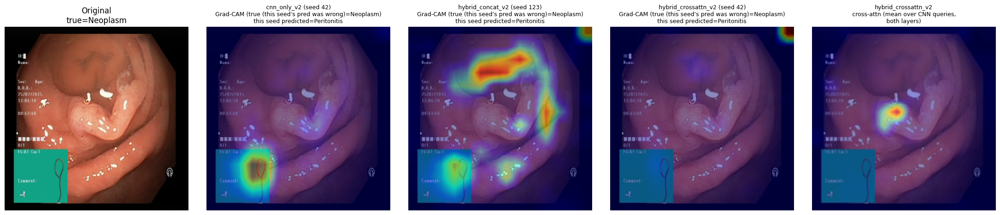

[after idx=136 (unanimous_error)] GPU memory: 0.77 GiB allocated, 1.12 GiB reserved, 14.56 GiB total, 3 model(s) cached

[unanimous_error] test_idx=315  true=Ureters
predictions: {'cnn_only_v2': 'Neoplasm', 'vit_only_v2': 'Neoplasm', 'hybrid_concat_v2': 'Neoplasm', 'hybrid_crossattn_v2': 'Neoplasm'}


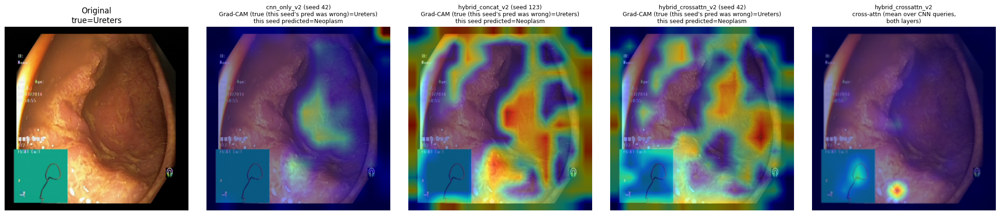

[after idx=315 (unanimous_error)] GPU memory: 0.78 GiB allocated, 1.44 GiB reserved, 14.56 GiB total, 3 model(s) cached

[unanimous_error] test_idx=374  true=Ureters
predictions: {'cnn_only_v2': 'Peritonitis', 'vit_only_v2': 'Peritonitis', 'hybrid_concat_v2': 'Peritonitis', 'hybrid_crossattn_v2': 'Peritonitis'}


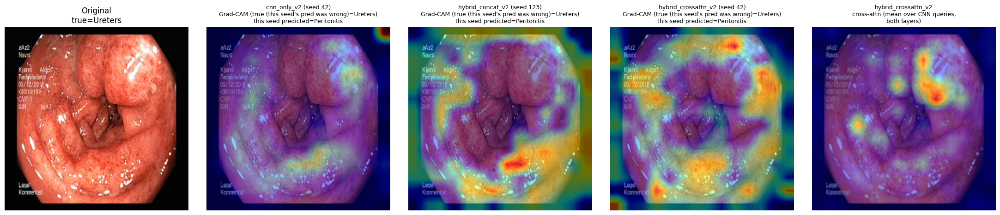

[after idx=374 (unanimous_error)] GPU memory: 0.78 GiB allocated, 1.52 GiB reserved, 14.56 GiB total, 3 model(s) cached

[dominant_confusion_pair] test_idx=374  true=Ureters
predictions: {'cnn_only_v2': 'Peritonitis', 'vit_only_v2': 'Peritonitis', 'hybrid_concat_v2': 'Peritonitis', 'hybrid_crossattn_v2': 'Peritonitis'}


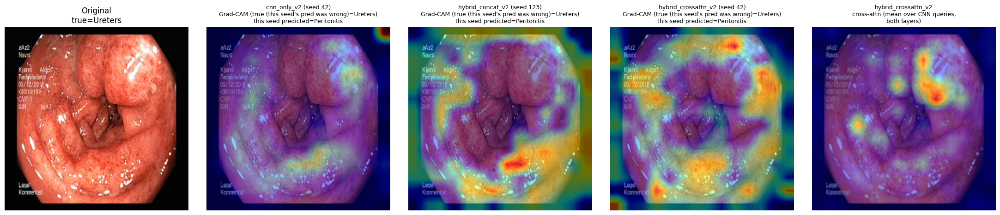

[after idx=374 (dominant_confusion_pair)] GPU memory: 0.78 GiB allocated, 1.55 GiB reserved, 14.56 GiB total, 3 model(s) cached

[dominant_confusion_pair] test_idx=396  true=Ureters
predictions: {'cnn_only_v2': 'Peritonitis', 'vit_only_v2': 'Ureters', 'hybrid_concat_v2': 'Peritonitis', 'hybrid_crossattn_v2': 'Peritonitis'}


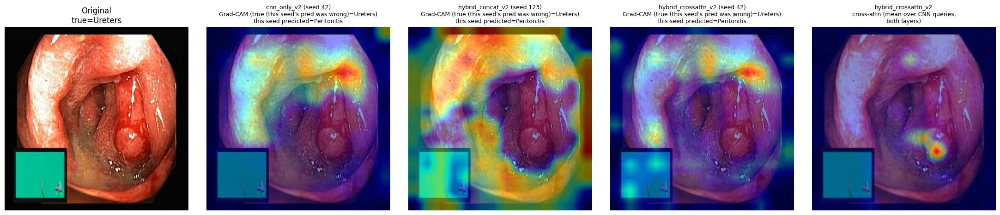

[after idx=396 (dominant_confusion_pair)] GPU memory: 0.78 GiB allocated, 1.55 GiB reserved, 14.56 GiB total, 3 model(s) cached

[dominant_confusion_pair] test_idx=331  true=Ureters
predictions: {'cnn_only_v2': 'Ureters', 'vit_only_v2': 'Ureters', 'hybrid_concat_v2': 'Ureters', 'hybrid_crossattn_v2': 'Peritonitis'}


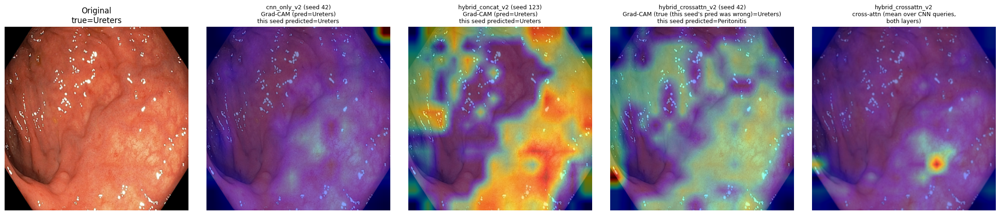

[after idx=331 (dominant_confusion_pair)] GPU memory: 0.79 GiB allocated, 1.56 GiB reserved, 14.56 GiB total, 3 model(s) cached

[control_correct] test_idx=276  true=Peritonitis
predictions: {'cnn_only_v2': 'Peritonitis', 'vit_only_v2': 'Peritonitis', 'hybrid_concat_v2': 'Peritonitis', 'hybrid_crossattn_v2': 'Peritonitis'}


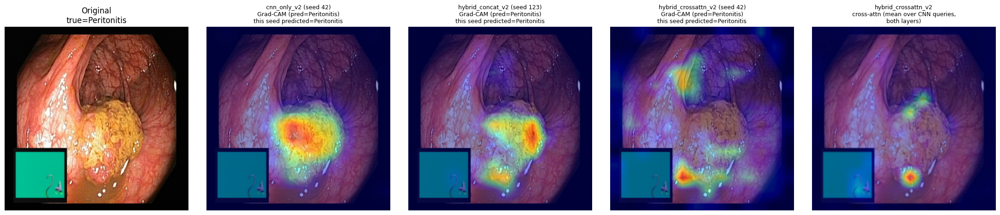

[after idx=276 (control_correct)] GPU memory: 0.79 GiB allocated, 1.58 GiB reserved, 14.56 GiB total, 3 model(s) cached

[control_correct] test_idx=196  true=Neoplasm
predictions: {'cnn_only_v2': 'Neoplasm', 'vit_only_v2': 'Neoplasm', 'hybrid_concat_v2': 'Neoplasm', 'hybrid_crossattn_v2': 'Neoplasm'}


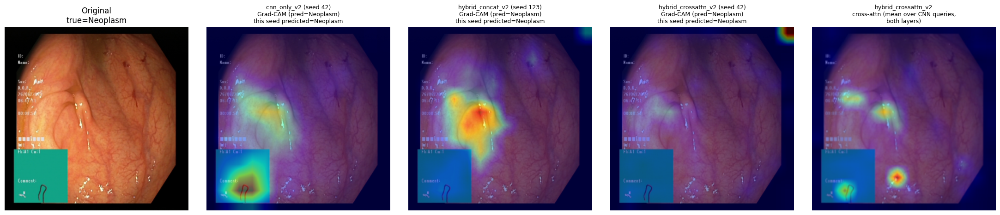

[after idx=196 (control_correct)] GPU memory: 0.79 GiB allocated, 1.56 GiB reserved, 14.56 GiB total, 3 model(s) cached
[after Section 6 cleanup (free_all_models)] GPU memory: 0.02 GiB allocated, 0.02 GiB reserved, 14.56 GiB total, 0 model(s) cached


In [18]:
analysis_dir = os.path.join(EXPERIMENTS_ROOT, "analysis")
os.makedirs(analysis_dir, exist_ok=True)

gpu_mem_report("before Section 6 (Grad-CAM + cross-attn)")
for tag, idx in PRIORITY_INDICES:
    visualize_target_image(tag, idx, test_entries[idx],
                            save_path=os.path.join(analysis_dir, f"nb7_gradcam_crossattn_idx{idx}_{tag}.png"))
    gpu_mem_report(f"after idx={idx} ({tag})")

# Section 6 is done with its models -- release them all before Section 7 starts,
# rather than letting them sit cached on GPU for the rest of the notebook.
free_all_models()
gpu_mem_report("after Section 6 cleanup (free_all_models)")

## 7. t-SNE of learned features (representative seed per family)

Even though NB6 found no significant accuracy difference between architectures, they could still organize the *same* 400 test images differently in feature space — e.g. `hybrid_crossattn_v2` producing more cleanly separated class clusters than `hybrid_concat_v2` despite near-identical accuracy would be a real, reportable qualitative difference C.2 item 3 asks for.

Feature dimensionality per family: `cnn_only_v2`=1792 (post-avgpool), `vit_only_v2`=384 (timm pre-logits pooled), `hybrid_concat_v2`=2176 (concatenated), `hybrid_crossattn_v2`=256 (post cross-attention, pre-classifier).

In [19]:
@torch.no_grad()
def extract_features_and_probs(family, seed, batch_size=8):
    """Batched inference over the full test set. Returns (features [N,D], probs [N,4], preds [N]).
    batch_size default lowered from 16 to 8 -- matches this project's own convention
    (NB3/NB5 also drop hybrid-model batch size under memory pressure) and gives some
    safety margin on top of the Section 6/free_model() cleanup below. Lower further
    (4 or 2) if OOM persists on your GPU."""
    model, cfg = load_checkpoint(family, seed)
    dual = MODEL_FAMILY_INFO[family]["dual_input"]

    if family == "cnn_only_v2":
        ds = GastroDataset(test_entries, IMG_SIZE_CNN)
    elif family == "vit_only_v2":
        ds = GastroDataset(test_entries, IMG_SIZE_VIT)
    else:
        ds = GastroDualDataset(test_entries, train=False)
    loader = torch.utils.data.DataLoader(ds, batch_size=batch_size, shuffle=False, num_workers=2)

    all_feats, all_probs, all_preds = [], [], []
    for batch in loader:
        if dual:
            cnn_imgs, vit_imgs, labels = batch
            cnn_imgs, vit_imgs = cnn_imgs.to(device), vit_imgs.to(device)
            if family == "hybrid_concat_v2":
                feats = model.forward_fused_features(cnn_imgs, vit_imgs)
                logits = model.classifier(feats)
            else:  # hybrid_crossattn_v2
                logits, feats = model(cnn_imgs, vit_imgs, return_pooled=True)
        else:
            imgs, labels = batch
            imgs = imgs.to(device)
            if family == "cnn_only_v2":
                feat_map = model.features(imgs)
                feats = torch.flatten(model.avgpool(feat_map), 1)
                logits = model.classifier(feats)
            else:  # vit_only_v2
                tokens = model.forward_features(imgs)
                feats = model.forward_head(tokens, pre_logits=True)
                logits = model.head(feats)  # equivalent to forward_head(tokens) but without redoing pooling

        probs = F.softmax(logits, dim=1)
        all_feats.append(feats.cpu().numpy())
        all_probs.append(probs.cpu().numpy())
        all_preds.append(logits.argmax(dim=1).cpu().numpy())

        # Batch tensors are only needed long enough to move their results to CPU
        # (above) -- drop the GPU-resident batch itself before the next iteration
        # so a large test set doesn't accumulate 50 batches' worth of activations.
        del logits, probs, feats
        if dual:
            del cnn_imgs, vit_imgs
        else:
            del imgs

    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    return np.concatenate(all_feats), np.concatenate(all_probs), np.concatenate(all_preds)

print("extract_features_and_probs() ready.")

extract_features_and_probs() ready.


In [20]:
from sklearn.manifold import TSNE

gpu_mem_report("before Section 7 (t-SNE feature extraction)")
tsne_features = {}
for fam in MODEL_FAMILIES:
    seed = REP_SEED[fam]
    print(f"Extracting features for {fam} (seed {seed})...")
    feats, probs, preds = extract_features_and_probs(fam, seed)
    tsne_features[fam] = feats
    # sanity check: predictions from this fresh forward pass should match the
    # single-seed predictions already stored in results.json for the same seed
    stored_preds = np.array(results_data[fam][seed]["predictions"])
    mismatch = (preds != stored_preds).sum()
    if mismatch > 0:
        print(f"  [WARNING] {mismatch}/{len(preds)} predictions differ from stored results.json "
              f"for {fam} seed {seed} -- check you're pointed at the same checkpoint/split.")
    else:
        print(f"  [OK] predictions match results.json exactly ({len(preds)}/{len(preds)}).")

    # This checkpoint isn't needed again -- release it immediately rather than
    # leaving 4 models stacked up on GPU by the time Section 8 starts.
    free_model(fam, seed)
    gpu_mem_report(f"after {fam} (seed {seed}), freed")

[before Section 7 (t-SNE feature extraction)] GPU memory: 0.02 GiB allocated, 0.02 GiB reserved, 14.56 GiB total, 0 model(s) cached
Extracting features for cnn_only_v2 (seed 42)...
  [OK] predictions match results.json exactly (400/400).
[after cnn_only_v2 (seed 42), freed] GPU memory: 0.02 GiB allocated, 0.02 GiB reserved, 14.56 GiB total, 0 model(s) cached
Extracting features for vit_only_v2 (seed 42)...
  [OK] predictions match results.json exactly (400/400).
[after vit_only_v2 (seed 42), freed] GPU memory: 0.02 GiB allocated, 0.02 GiB reserved, 14.56 GiB total, 0 model(s) cached
Extracting features for hybrid_concat_v2 (seed 123)...
  [OK] predictions match results.json exactly (400/400).
[after hybrid_concat_v2 (seed 123), freed] GPU memory: 0.02 GiB allocated, 0.02 GiB reserved, 14.56 GiB total, 0 model(s) cached
Extracting features for hybrid_crossattn_v2 (seed 42)...
  [OK] predictions match results.json exactly (400/400).
[after hybrid_crossattn_v2 (seed 42), freed] GPU memory

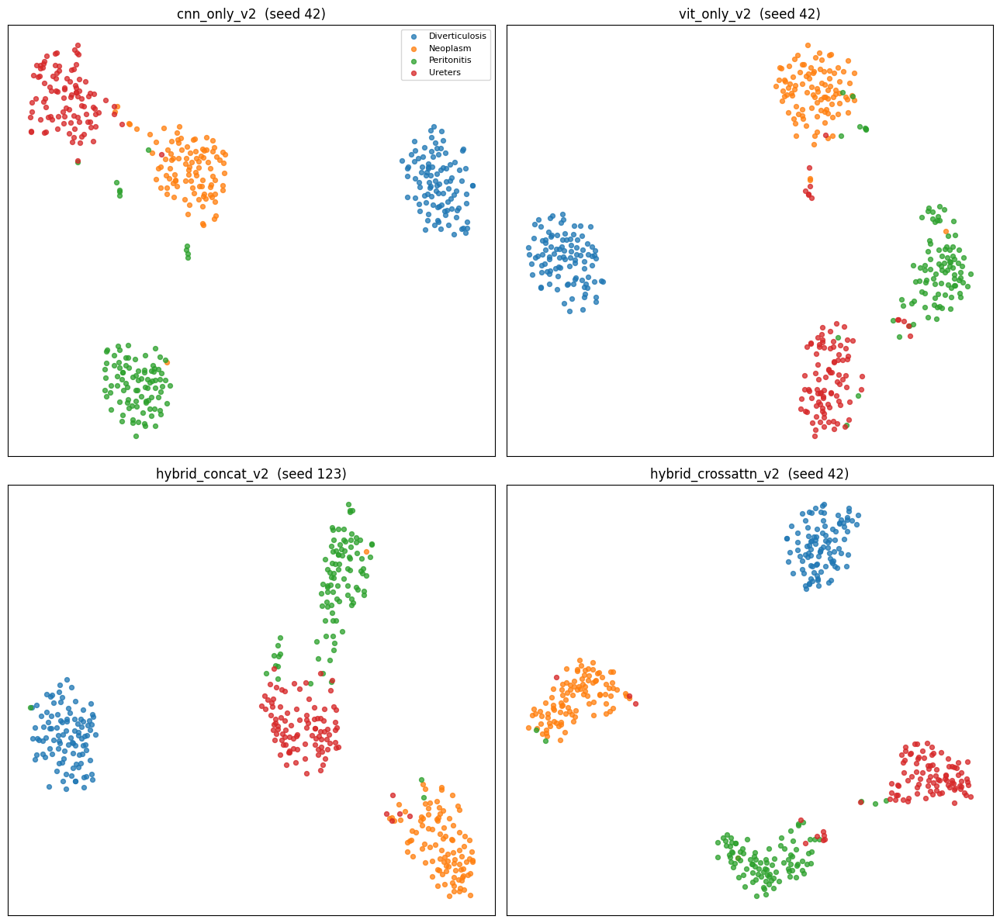

In [21]:
fig, axes = plt.subplots(2, 2, figsize=(13, 12))
cmap = plt.get_cmap("tab10")

for ax, fam in zip(axes.flat, MODEL_FAMILIES):
    emb = TSNE(n_components=2, perplexity=30, random_state=42, init="pca").fit_transform(tsne_features[fam])
    for cls_idx, cls_name in enumerate(CLASS_NAMES):
        mask = LABELS == cls_idx
        ax.scatter(emb[mask, 0], emb[mask, 1], s=18, color=cmap(cls_idx), label=cls_name, alpha=0.75)
    ax.set_title(f"{fam}  (seed {REP_SEED[fam]})")
    ax.set_xticks([]); ax.set_yticks([])

axes[0, 0].legend(loc="best", fontsize=8)
plt.tight_layout()
plt.savefig(os.path.join(EXPERIMENTS_ROOT, "analysis", "nb7_tsne.png"), dpi=120, bbox_inches="tight")
plt.show()

## 8. Calibration — Expected Calibration Error (ECE) & reliability diagrams

"Which model's confidence can actually be trusted" (C.2 item 3) — a model can be accurate but overconfident (or underconfident), which matters for a clinical-adjacent tool even when raw accuracy is tied across architectures. Computed per seed (all 3), reported as mean±std like every other metric in this project (A.5/A.12) — not just the representative seed.

In [22]:
def expected_calibration_error(probs, labels, n_bins=15):
    """Standard equal-width-bin ECE. probs: [N,C] softmax outputs. labels: [N] int.
    Returns (ece, bin_confidences, bin_accuracies, bin_counts) for the reliability diagram."""
    confidences = probs.max(axis=1)
    predictions = probs.argmax(axis=1)
    correct = (predictions == labels).astype(float)

    bin_edges = np.linspace(0, 1, n_bins + 1)
    bin_confidences, bin_accuracies, bin_counts = [], [], []
    ece = 0.0
    n = len(labels)
    for i in range(n_bins):
        lo, hi = bin_edges[i], bin_edges[i + 1]
        in_bin = (confidences > lo) & (confidences <= hi) if i > 0 else (confidences >= lo) & (confidences <= hi)
        count = in_bin.sum()
        if count == 0:
            bin_confidences.append(np.nan); bin_accuracies.append(np.nan); bin_counts.append(0)
            continue
        bin_acc = correct[in_bin].mean()
        bin_conf = confidences[in_bin].mean()
        ece += (count / n) * abs(bin_acc - bin_conf)
        bin_confidences.append(bin_conf); bin_accuracies.append(bin_acc); bin_counts.append(int(count))

    return ece, np.array(bin_confidences), np.array(bin_accuracies), np.array(bin_counts)

print("expected_calibration_error() ready.")

expected_calibration_error() ready.


In [23]:
gpu_mem_report("before Section 8 (calibration, 12 checkpoints total)")

ece_rows = []
pooled_probs = defaultdict(list)   # for the reliability-diagram plot (Section 8b)
pooled_labels = defaultdict(list)
entropy_correct = defaultdict(list)
entropy_incorrect = defaultdict(list)

for fam in MODEL_FAMILIES:
    for seed in SEEDS:
        feats, probs, preds = extract_features_and_probs(fam, seed)
        ece, _, _, _ = expected_calibration_error(probs, LABELS, n_bins=15)
        ece_rows.append({"model_family": fam, "seed": seed, "ece": ece})

        pooled_probs[fam].append(probs)
        pooled_labels[fam].append(LABELS)

        entropy = -(probs * np.log(probs + 1e-12)).sum(axis=1)
        correct_mask = preds == LABELS
        entropy_correct[fam].extend(entropy[correct_mask].tolist())
        entropy_incorrect[fam].extend(entropy[~correct_mask].tolist())

        print(f"{fam:22s} seed={seed:<4} ECE={ece:.4f}")

        # Unlike Section 7's representative seeds, NONE of these 12 (family, seed)
        # checkpoints are reused anywhere else in this notebook -- free each one
        # right after its one-time use instead of caching all 12 simultaneously,
        # which is what actually exhausted a 14.56 GiB GPU before this fix.
        free_model(fam, seed)

    gpu_mem_report(f"after all seeds of {fam}")

ece_df = pd.DataFrame(ece_rows)
ece_summary = ece_df.groupby("model_family")["ece"].agg(["mean", "std"]).reset_index().sort_values("mean")
print("\nECE mean +/- std across 3 seeds (lower = better calibrated):")
print(ece_summary.to_string(index=False, formatters={"mean": "{:.4f}".format, "std": "{:.4f}".format}))

[before Section 8 (calibration, 12 checkpoints total)] GPU memory: 0.02 GiB allocated, 0.02 GiB reserved, 14.56 GiB total, 0 model(s) cached
cnn_only_v2            seed=42   ECE=0.0091
cnn_only_v2            seed=123  ECE=0.0128
cnn_only_v2            seed=7    ECE=0.0159
[after all seeds of cnn_only_v2] GPU memory: 0.02 GiB allocated, 0.02 GiB reserved, 14.56 GiB total, 0 model(s) cached
vit_only_v2            seed=42   ECE=0.0265
vit_only_v2            seed=123  ECE=0.0300
vit_only_v2            seed=7    ECE=0.0142
[after all seeds of vit_only_v2] GPU memory: 0.02 GiB allocated, 0.02 GiB reserved, 14.56 GiB total, 0 model(s) cached
hybrid_concat_v2       seed=42   ECE=0.0165
hybrid_concat_v2       seed=123  ECE=0.0200
hybrid_concat_v2       seed=7    ECE=0.0182
[after all seeds of hybrid_concat_v2] GPU memory: 0.02 GiB allocated, 0.02 GiB reserved, 14.56 GiB total, 0 model(s) cached
hybrid_crossattn_v2    seed=42   ECE=0.0546
hybrid_crossattn_v2    seed=123  ECE=0.0637
hybrid_crossa

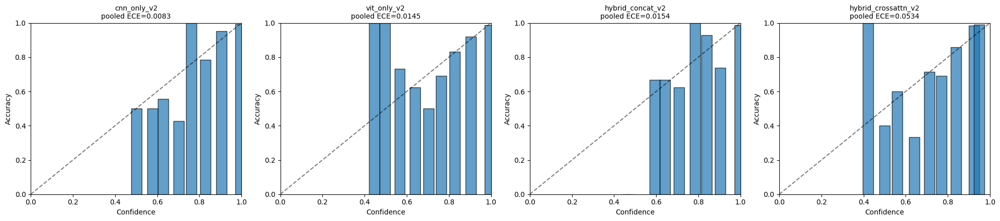

In [24]:
fig, axes = plt.subplots(1, 4, figsize=(20, 4.5))
for ax, fam in zip(axes, MODEL_FAMILIES):
    probs_pooled = np.concatenate(pooled_probs[fam])
    labels_pooled = np.concatenate(pooled_labels[fam])
    ece, bin_conf, bin_acc, bin_count = expected_calibration_error(probs_pooled, labels_pooled, n_bins=15)
    ax.plot([0, 1], [0, 1], "k--", alpha=0.5, label="perfect calibration")
    valid = ~np.isnan(bin_acc)
    ax.bar(bin_conf[valid], bin_acc[valid], width=0.05, alpha=0.7, edgecolor="black")
    ax.set_title(f"{fam}\npooled ECE={ece:.4f}", fontsize=10)
    ax.set_xlabel("Confidence"); ax.set_ylabel("Accuracy")
    ax.set_xlim(0, 1); ax.set_ylim(0, 1)
plt.tight_layout()
plt.savefig(os.path.join(EXPERIMENTS_ROOT, "analysis", "nb7_reliability_diagrams.png"), dpi=120, bbox_inches="tight")
plt.show()

In [25]:
entropy_rows = []
for fam in MODEL_FAMILIES:
    entropy_rows.append({
        "model_family": fam,
        "mean_entropy_when_correct": np.mean(entropy_correct[fam]) if entropy_correct[fam] else np.nan,
        "mean_entropy_when_incorrect": np.mean(entropy_incorrect[fam]) if entropy_incorrect[fam] else np.nan,
        "n_correct": len(entropy_correct[fam]),
        "n_incorrect": len(entropy_incorrect[fam]),
    })
entropy_df = pd.DataFrame(entropy_rows)
print("Predictive entropy (higher = less confident), pooled across all 3 seeds:")
print(entropy_df.to_string(index=False, formatters={c: "{:.4f}".format for c in ["mean_entropy_when_correct","mean_entropy_when_incorrect"]}))

Predictive entropy (higher = less confident), pooled across all 3 seeds:
       model_family mean_entropy_when_correct mean_entropy_when_incorrect  n_correct  n_incorrect
        cnn_only_v2                    0.0387                      0.4731       1176           24
        vit_only_v2                    0.0606                      0.3866       1166           34
   hybrid_concat_v2                    0.0339                      0.3457       1172           28
hybrid_crossattn_v2                    0.3194                      0.6325       1162           38


## 9. Auto-generated interpretation

In [26]:
best_calibrated = ece_summary.iloc[0]
worst_calibrated = ece_summary.iloc[-1]
print(f"Best-calibrated (lowest ECE): {best_calibrated['model_family']} "
      f"(ECE={best_calibrated['mean']:.4f} +/- {best_calibrated['std']:.4f})")
print(f"Worst-calibrated (highest ECE): {worst_calibrated['model_family']} "
      f"(ECE={worst_calibrated['mean']:.4f} +/- {worst_calibrated['std']:.4f})")

for fam in MODEL_FAMILIES:
    row = entropy_df[entropy_df.model_family == fam].iloc[0]
    gap = row["mean_entropy_when_incorrect"] - row["mean_entropy_when_correct"]
    direction = "appropriately less confident" if gap > 0 else "WARNING: not less confident"
    print(f"{fam:22s}: {direction} when wrong (entropy gap = {gap:+.4f})")

print("\nReminder: NB6 already established none of these 4 architectures differ "
      "significantly on raw accuracy. The t-SNE (Section 7) and calibration "
      "results above are the actual differentiators this notebook was built to "
      "find -- report them as the qualitative/behavioral finding, not as a way "
      "to declare a hidden accuracy winner.")

Best-calibrated (lowest ECE): cnn_only_v2 (ECE=0.0126 +/- 0.0034)
Worst-calibrated (highest ECE): hybrid_crossattn_v2 (ECE=0.0594 +/- 0.0046)
cnn_only_v2           : appropriately less confident when wrong (entropy gap = +0.4344)
vit_only_v2           : appropriately less confident when wrong (entropy gap = +0.3260)
hybrid_concat_v2      : appropriately less confident when wrong (entropy gap = +0.3118)
hybrid_crossattn_v2   : appropriately less confident when wrong (entropy gap = +0.3131)

Reminder: NB6 already established none of these 4 architectures differ significantly on raw accuracy. The t-SNE (Section 7) and calibration results above are the actual differentiators this notebook was built to find -- report them as the qualitative/behavioral finding, not as a way to declare a hidden accuracy winner.


## 10. Save outputs

Figures were already saved inline (Sections 6, 7, 8) to `EXPERIMENTS_ROOT/analysis/`. This cell saves the remaining numeric tables.

In [27]:
ece_df.to_csv(os.path.join(analysis_dir, "nb7_ece_per_seed.csv"), index=False)
ece_summary.to_csv(os.path.join(analysis_dir, "nb7_ece_summary.csv"), index=False)
entropy_df.to_csv(os.path.join(analysis_dir, "nb7_entropy_correct_vs_incorrect.csv"), index=False)

priority_df = pd.DataFrame([
    {"tag": tag, "test_index": i, "true_class": CLASS_NAMES[LABELS[i]], "image_path": test_entries[i][0]}
    for tag, i in PRIORITY_INDICES
])
priority_df.to_csv(os.path.join(analysis_dir, "nb7_priority_target_images.csv"), index=False)

print(f"Saved to {analysis_dir}:")
print("  nb7_gradcam_crossattn_idx*_*.png   -- one figure per priority target image (Section 6)")
print("  nb7_tsne.png                        -- 4-panel t-SNE (Section 7)")
print("  nb7_reliability_diagrams.png        -- 4-panel calibration plot (Section 8)")
print("  nb7_ece_per_seed.csv / nb7_ece_summary.csv")
print("  nb7_entropy_correct_vs_incorrect.csv")
print("  nb7_priority_target_images.csv")

Saved to /content/drive/MyDrive/gastronet_experiments/analysis:
  nb7_gradcam_crossattn_idx*_*.png   -- one figure per priority target image (Section 6)
  nb7_tsne.png                        -- 4-panel t-SNE (Section 7)
  nb7_reliability_diagrams.png        -- 4-panel calibration plot (Section 8)
  nb7_ece_per_seed.csv / nb7_ece_summary.csv
  nb7_entropy_correct_vs_incorrect.csv
  nb7_priority_target_images.csv


## Next steps

1. **Manually review the unanimous-error images** (Section 6's `unanimous_error` figures) — if they look genuinely ambiguous/borderline to a human, that's a real, citable line for the paper's discussion of the accuracy ceiling (A.2/A.3).
2. **Section 7's t-SNE** is the main candidate for "cross-attention adds something even at tied accuracy" — check qualitatively whether `hybrid_crossattn_v2`'s clusters look tighter/more separated than `hybrid_concat_v2`'s.
3. **Section 8's calibration table** feeds directly into C.2 item 4's efficiency/deployment table ("if these are statistically tied on accuracy, here's which one you'd actually deploy") — calibration is a legitimate tie-breaker alongside params/FLOPs/training time.
4. **C.2 item 4** (efficiency/training-cost table: params, FLOPs, epochs-to-converge, wall-clock time) is next per Part D — cheap, and the per-seed epoch counts are already sitting in each seed's `history.json`.